# 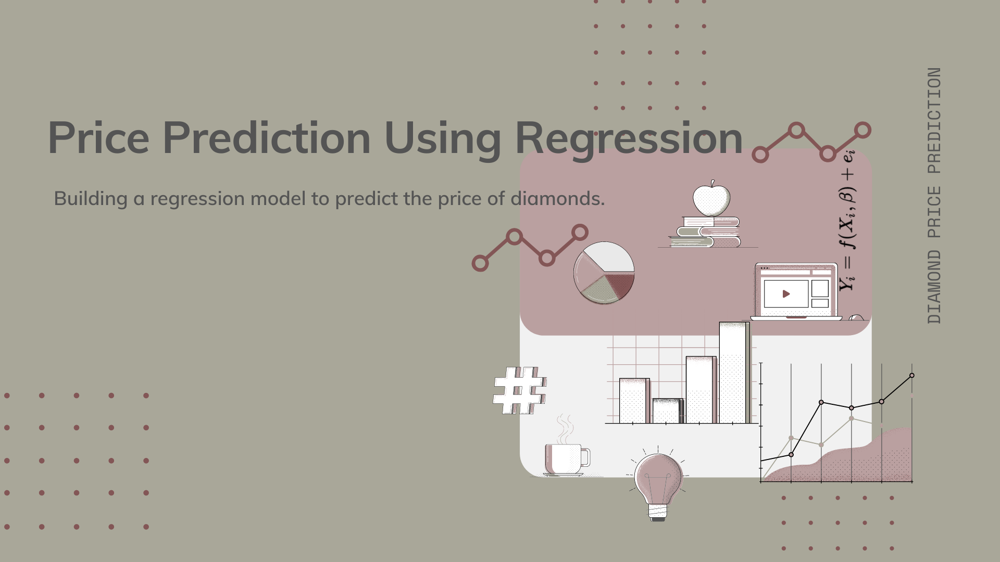

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython import get_ipython
import warnings
warnings.filterwarnings("ignore")

# Loading Data 

In [2]:
df=pd.read_csv(r'C:\Users\HP\Downloads\diamonds.csv')
df.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [3]:
df.tail()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
53935,53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74
53939,53940,0.75,Ideal,D,SI2,62.2,55.0,2757,5.83,5.87,3.64


In [4]:
df.sample(3)

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
17671,17672,1.32,Very Good,I,VS2,60.5,59.0,7125,7.02,7.06,4.26
4390,4391,0.31,Very Good,D,SI1,62.9,56.0,571,4.31,4.34,2.72
7108,7109,0.92,Very Good,D,SI2,62.4,60.0,4168,6.21,6.25,3.89


# Data Preprocessing
Steps involved in Data Preprocessing

Data cleaning

Identifying and removing outliers

Encoding categorical variables

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [6]:
df.shape

(53940, 11)

In [7]:
df.columns

Index(['Unnamed: 0', 'carat', 'cut', 'color', 'clarity', 'depth', 'table',
       'price', 'x', 'y', 'z'],
      dtype='object')

In [8]:
df.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [9]:
df.corr()

,Unnamed: 0,carat,depth,table,price,x,y,z
Unnamed: 0,1.000000,-0.377983,-0.034800,-0.100830,-0.306873,-0.405440,-0.395843,-0.399208
carat,-0.377983,1.000000,0.028224,0.181618,0.921591,0.975094,0.951722,0.953387
depth,-0.034800,0.028224,1.000000,-0.295779,-0.010647,-0.025289,-0.029341,0.094924
table,-0.100830,0.181618,-0.295779,1.000000,0.127134,0.195344,0.183760,0.150929
price,-0.306873,0.921591,-0.010647,0.127134,1.000000,0.884435,0.865421,0.861249
x,-0.405440,0.975094,-0.025289,0.195344,0.884435,1.000000,0.974701,0.970772
y,-0.395843,0.951722,-0.029341,0.183760,0.865421,0.974701,1.000000,0.952006
z,-0.399208,0.953387,0.094924,0.150929,0.861249,0.970772,0.952006,1.000000


In [10]:
df.isnull().sum()

Unnamed: 0    0
carat         0
cut           0
color         0
clarity       0
depth         0
table         0
price         0
x             0
y             0
z             0
dtype: int64

In [11]:
df = df.drop('Unnamed: 0', axis = 1)

In [12]:
df['cut'].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [13]:
df['cut'].value_counts()

Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64

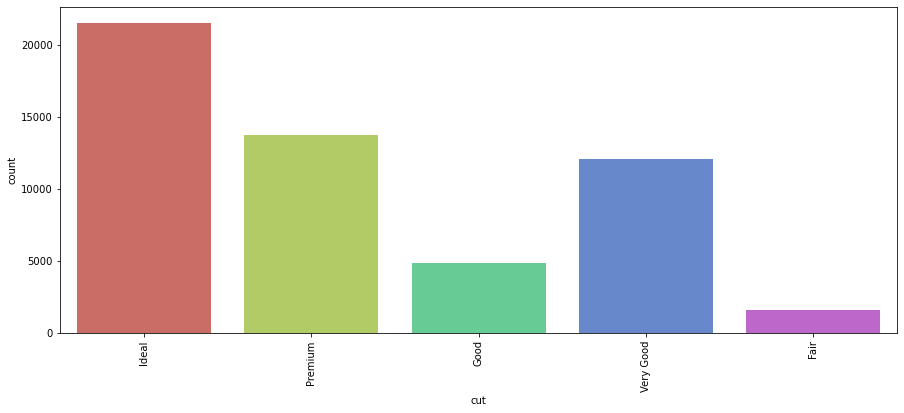

In [14]:
plt.figure(figsize=(15,6))
sns.countplot(df['cut'], data = df,palette='hls')
plt.xticks(rotation = 90)
plt.show()

In [15]:
import plotly.express as px

In [16]:
fig1 = px.histogram(df, x = 'cut', color = 'cut')
fig1.show()

In [17]:
df['color'].unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [18]:
df['color'].value_counts()

G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
Name: color, dtype: int64

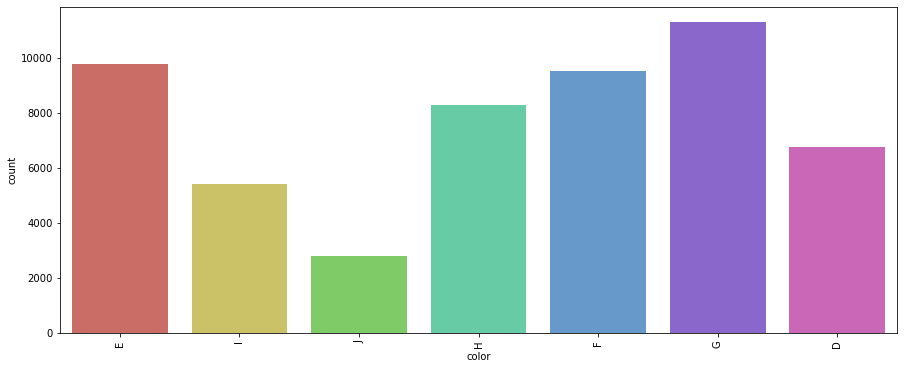

In [19]:
plt.figure(figsize=(15,6))
sns.countplot(df['color'], data = df,
palette='hls')
plt.xticks(rotation = 90)
plt.show()

In [20]:
fig2 = px.histogram(df, x = 'color', color = 'color')
fig2.show()

In [21]:
df['clarity'].unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [22]:
df['clarity'].value_counts()

SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
Name: clarity, dtype: int64

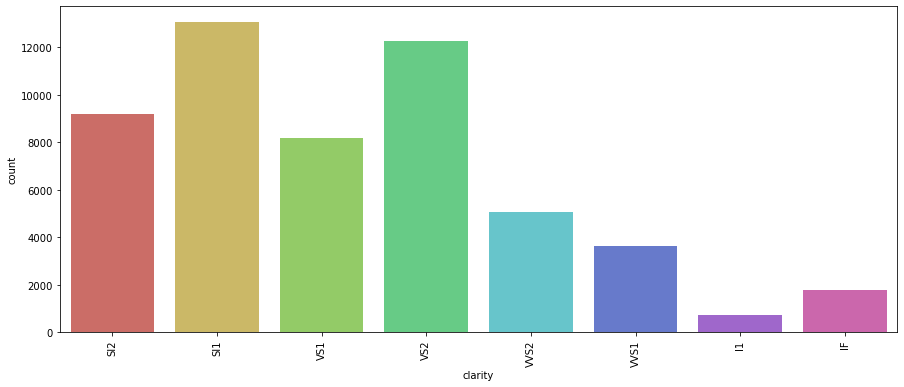

In [23]:
plt.figure(figsize=(15,6))
sns.countplot(df['clarity'], data = df,
palette='hls')
plt.xticks(rotation = 90)
plt.show()

In [24]:
fig3 = px.histogram(df, x = 'clarity', color = 'clarity')
fig3.show()

# Points to notice:

Min value of "x", "y", "z" are zero this indicates that there are faulty values in data that represents dimensionless or 2-dimensional diamonds. So we need to filter out those as it clearly faulty data points.

In [25]:
df = df.drop(df[df["x"]==0].index)
df = df.drop(df[df["y"]==0].index)
df = df.drop(df[df["z"]==0].index)

In [26]:
df.shape

(53920, 10)

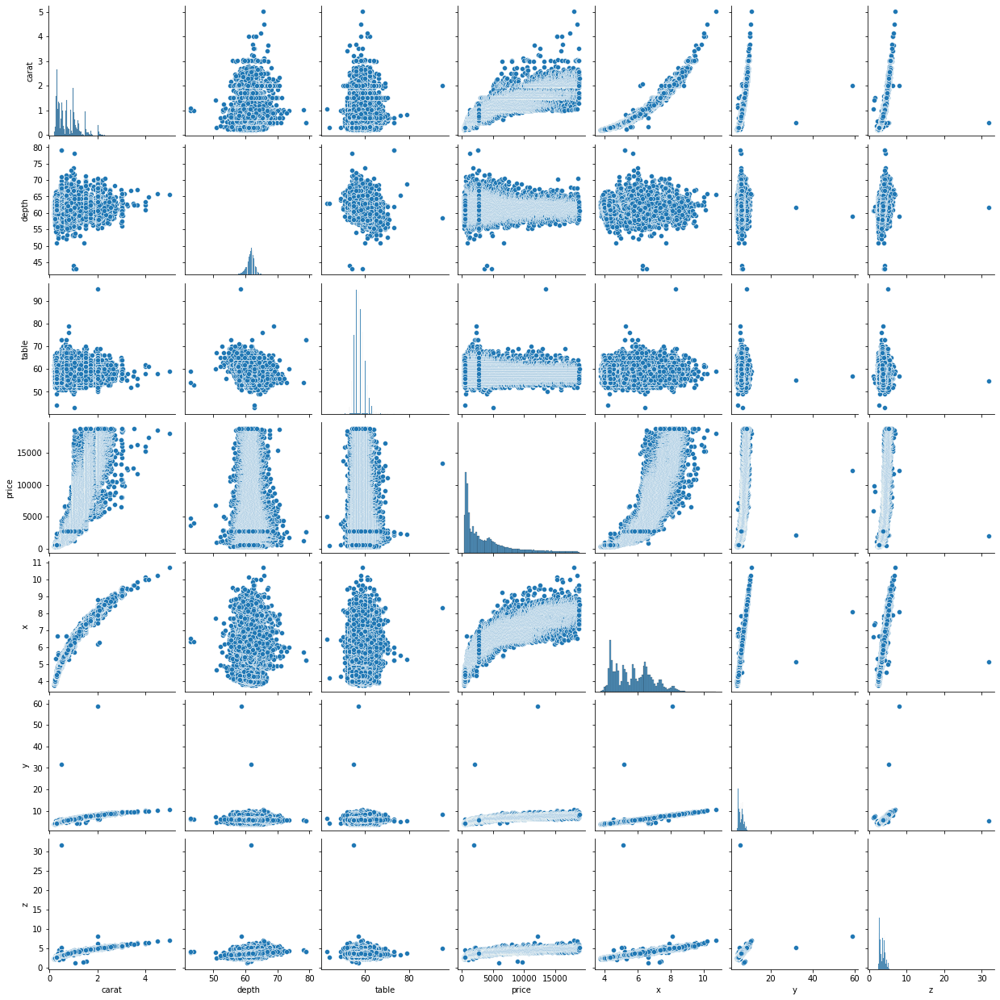

In [27]:
sns.pairplot(df)
plt.show()

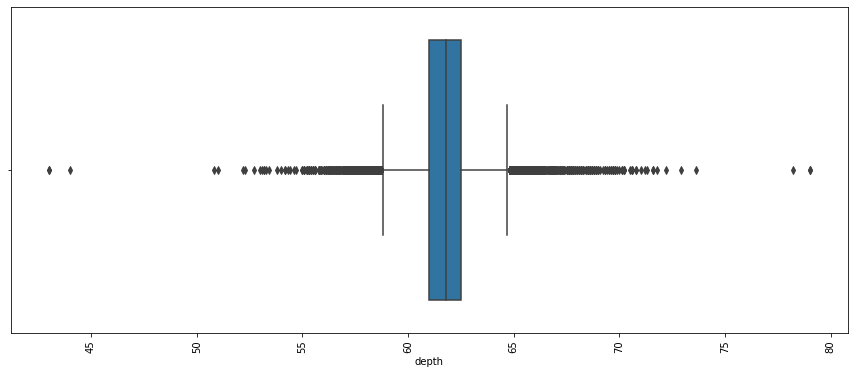

In [28]:
plt.figure(figsize=(15,6))
sns.boxplot(df['depth'])
plt.xticks(rotation = 90)
plt.show()

In [29]:
diamond_depth = df['depth']
Q3 = diamond_depth.quantile(0.75)
Q1 = diamond_depth.quantile(0.45)
IQR = Q3-Q1
lower_limit = Q1 -(1.5*IQR)
upper_limit = Q3 +(1.5*IQR)
depth_outliers = diamond_depth[(diamond_depth <lower_limit) | (diamond_depth >upper_limit)]
depth_outliers

1        59.8
2        56.9
8        65.1
9        59.4
10       64.0
         ... 
53918    59.3
53927    58.1
53930    60.5
53931    59.8
53932    60.5
Name: depth, Length: 11958, dtype: float64

In [30]:
df = df[(df["depth"]<75)&(df["depth"]>45)]

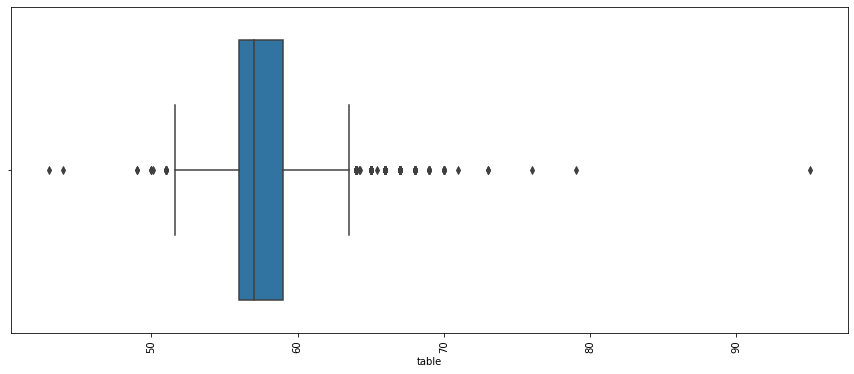

In [31]:
plt.figure(figsize=(15,6))
sns.boxplot(df['table'])
plt.xticks(rotation = 90)
plt.show()

In [32]:
diamond_table = df['table']
Q3 = diamond_table.quantile(0.80)
Q1 = diamond_table.quantile(0.40)
IQR = Q3-Q1
lower_limit = Q1 -(1.5*IQR)
upper_limit = Q3 +(1.5*IQR)
table_outliers = diamond_table[(diamond_table <lower_limit) | (diamond_table >upper_limit)]
table_outliers

2        65.0
43       63.0
91       69.0
115      53.0
122      63.0
         ... 
53825    63.0
53828    63.0
53840    63.0
53881    53.0
53897    63.0
Name: table, Length: 1968, dtype: float64

In [33]:
df = df[(df["table"]<80)&(df["table"]>40)]

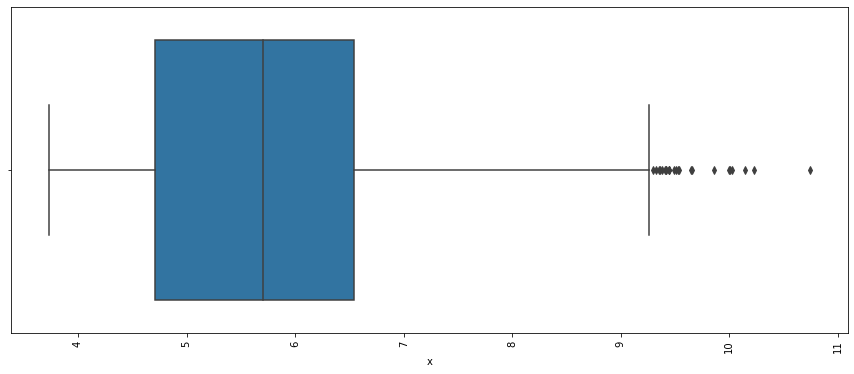

In [34]:
plt.figure(figsize=(15,6))
sns.boxplot(df['x'])
plt.xticks(rotation = 90)
plt.show()

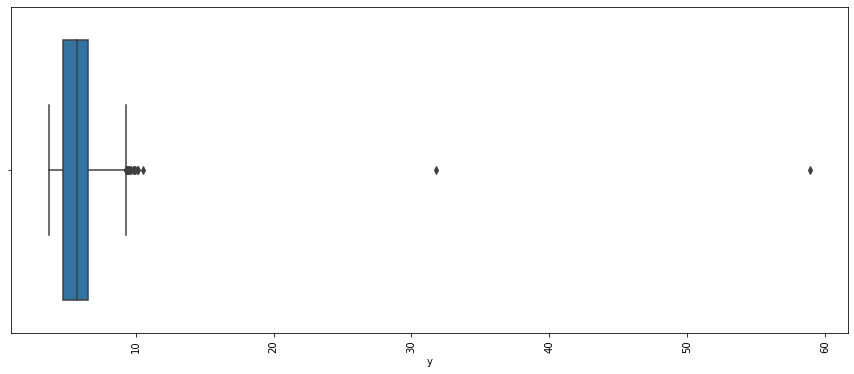

In [35]:
plt.figure(figsize=(15,6))
sns.boxplot(df['y'])
plt.xticks(rotation = 90)
plt.show()


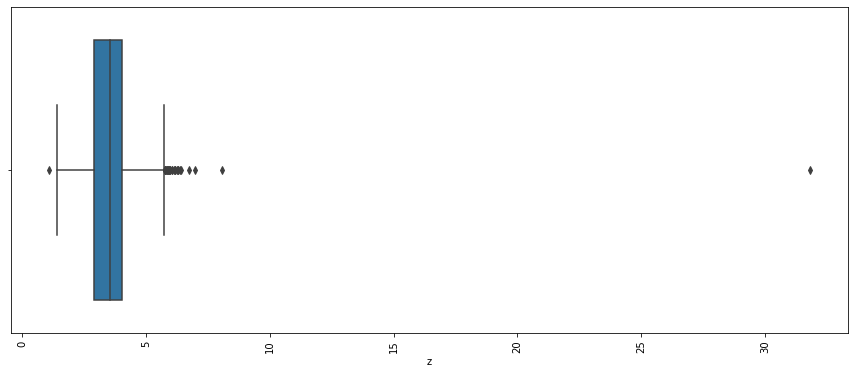

In [36]:
plt.figure(figsize=(15,6))
sns.boxplot(df['z'])
plt.xticks(rotation = 90)
plt.show()

In [37]:
df = df[(df["x"]<30)]
df = df[(df["y"]<30)]
df = df[(df["z"]<30)&(df["z"]>2)]

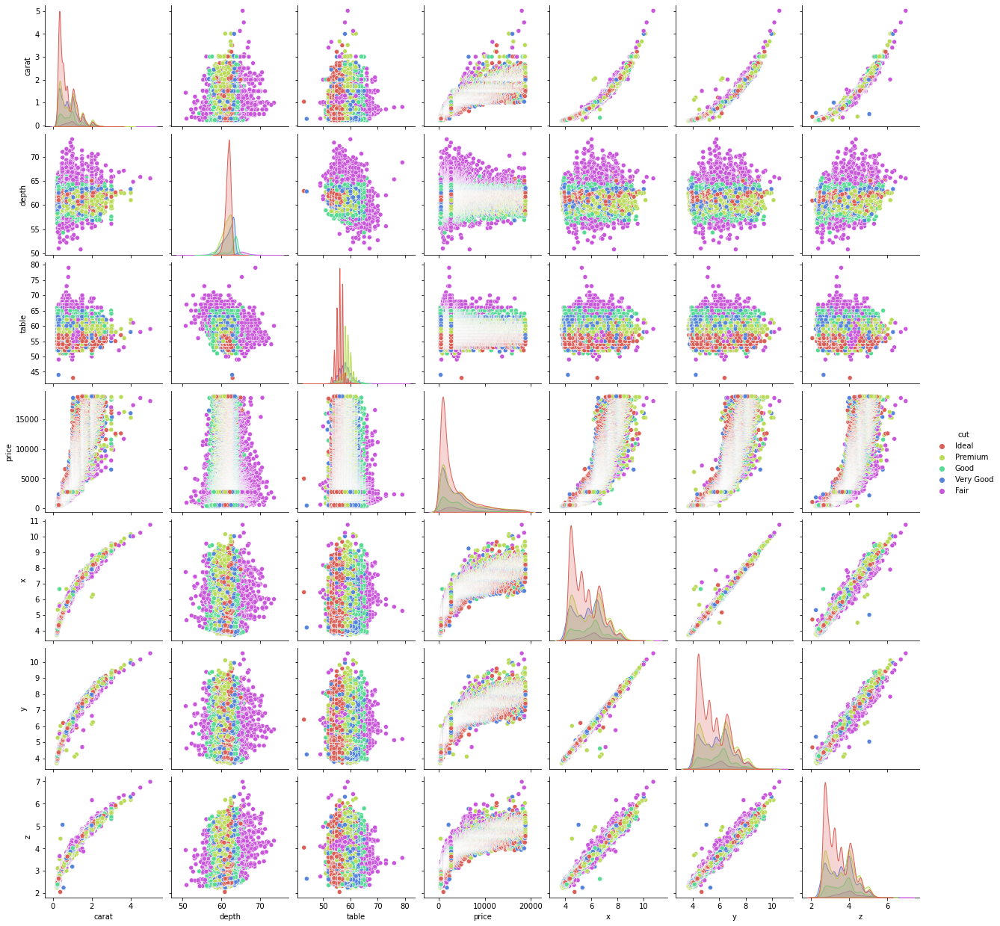

In [38]:
sns.pairplot(df, hue= "cut", palette = 'hls')
plt.show()

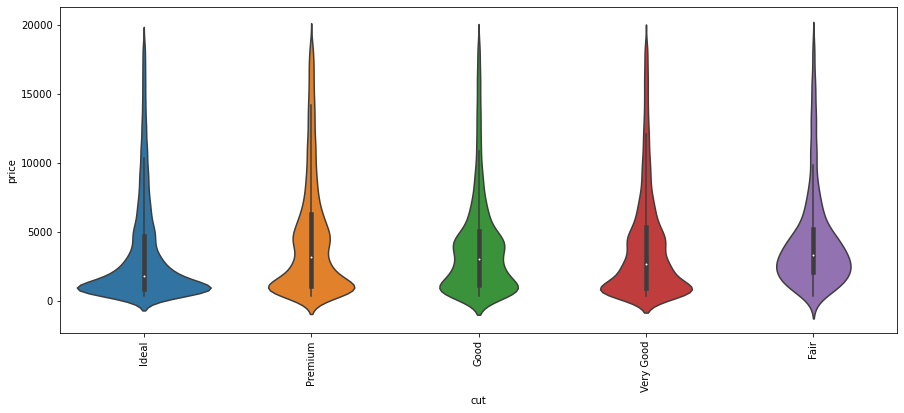

In [39]:
plt.figure(figsize=(15,6))
sns.violinplot(x = 'cut' , y = 'price' , data = df)
plt.xticks(rotation = 90)
plt.show()

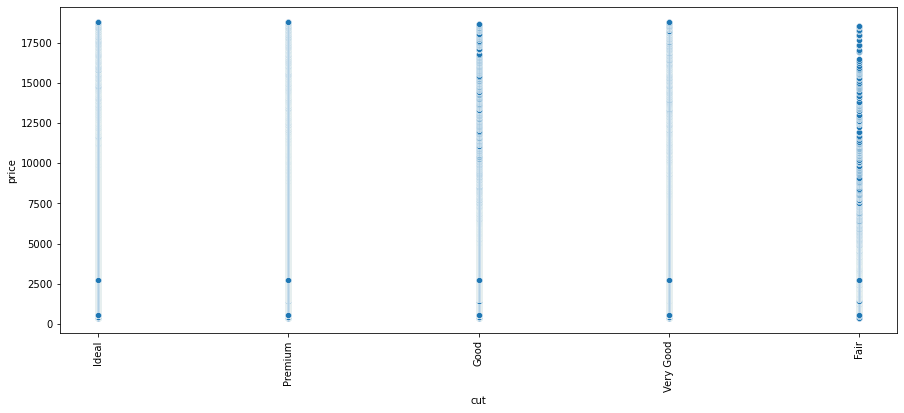

In [40]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = 'cut' , y = 'price' , data = df)
plt.xticks(rotation = 90)
plt.show()

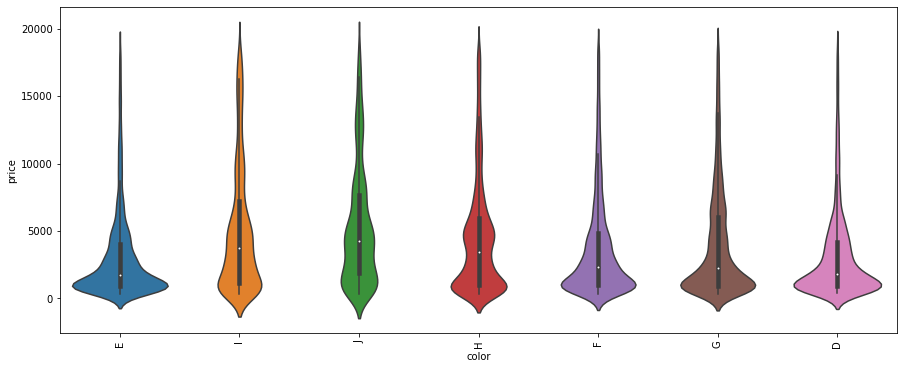

In [41]:
plt.figure(figsize=(15,6))
sns.violinplot(x = 'color' , y = 'price' , data = df)
plt.xticks(rotation = 90)
plt.show()

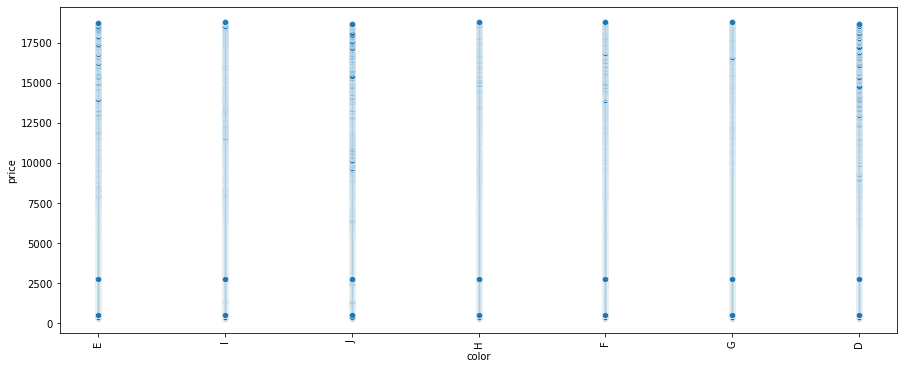

In [42]:
plt.figure(figsize=(15,6))
sns.scatterplot(x = 'color' , y = 'price' , data = df)
plt.xticks(rotation = 90)
plt.show()

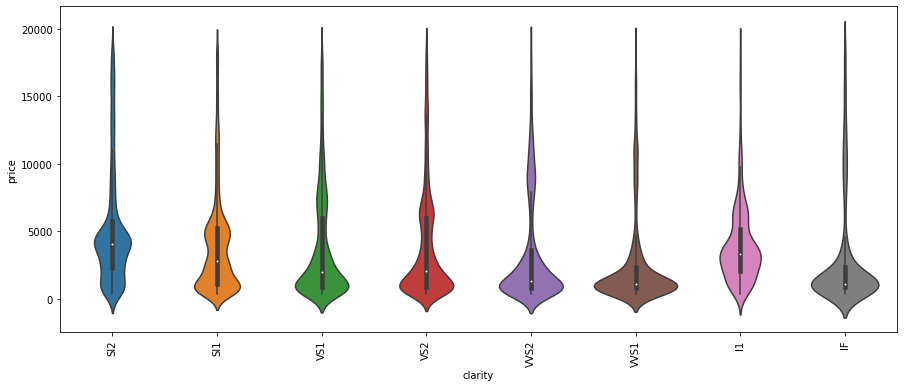

In [43]:
plt.figure(figsize=(15,6))
sns.violinplot(x = 'clarity' , y = 'price' , data = df)
plt.xticks(rotation = 90)
plt.show()

In [44]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn import metrics

In [45]:
s = (df.dtypes =="object")
object_cols = list(s[s].index)

In [47]:
label_data = df.copy()
# Apply label encoder to each column with categorical data
label_encoder = LabelEncoder()
for col in object_cols:
    label_data[col] = label_encoder.fit_transform(label_data[col])

In [48]:
label_data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,2,1,3,61.5,55.0,326,3.95,3.98,2.43
1,0.21,3,1,2,59.8,61.0,326,3.89,3.84,2.31
2,0.23,1,1,4,56.9,65.0,327,4.05,4.07,2.31
3,0.29,3,5,5,62.4,58.0,334,4.20,4.23,2.63
4,0.31,1,6,3,63.3,58.0,335,4.34,4.35,2.75


In [49]:
df.describe()

,carat,depth,table,price,x,y,z
count,53907.000000,53907.000000,53907.000000,53907.000000,53907.000000,53907.000000,53907.000000
mean,0.797628,61.749741,57.455948,3930.584470,5.731463,5.733292,3.539441
std,0.473765,1.420119,2.226153,3987.202815,1.119384,1.111252,0.691434
min,0.200000,50.800000,43.000000,326.000000,3.730000,3.680000,2.060000
25%,0.400000,61.000000,56.000000,949.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5322.000000,6.540000,6.540000,4.040000
max,5.010000,73.600000,79.000000,18823.000000,10.740000,10.540000,6.980000


In [50]:
df.corr()

,carat,depth,table,price,x,y,z
carat,1.000000,0.029267,0.181797,0.921590,0.977777,0.976860,0.977037
depth,0.029267,1.000000,-0.302218,-0.010287,-0.024401,-0.027543,0.097525
table,0.181797,-0.302218,1.000000,0.127108,0.196327,0.190153,0.155670
price,0.921590,-0.010287,0.127108,1.000000,0.887212,0.888807,0.882634
x,0.977777,-0.024401,0.196327,0.887212,1.000000,0.998657,0.991665
y,0.976860,-0.027543,0.190153,0.888807,0.998657,1.000000,0.991327
z,0.977037,0.097525,0.155670,0.882634,0.991665,0.991327,1.000000


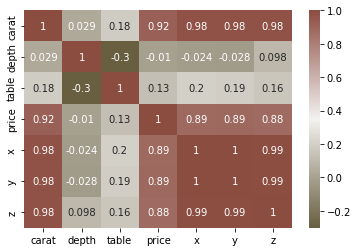

In [51]:
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
sns.heatmap(df.corr(), cmap=cmap,annot=True, )
plt.show()

# Model Building
Steps involved in Model Building:-

Setting up features and target

Build a pipeline of standard scalar and model for five different regressors.

Fit all the models on training data

Get mean of cross-validation on the training set for all the models for negative root mean square error

Pick the model with the best cross-validation score

Fit the best model on the training set and get

In [52]:
X= label_data.drop(["price"],axis =1)
y= label_data["price"]
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.25,random_state=7)

In [53]:
pipeline_lr=Pipeline([("scalar1",StandardScaler()),
("lr_classifier",LinearRegression())])
pipeline_dt=Pipeline([("scalar2",StandardScaler()),
("dt_classifier",DecisionTreeRegressor())])
pipeline_rf=Pipeline([("scalar3",StandardScaler()),
("rf_classifier",RandomForestRegressor())])
pipeline_kn=Pipeline([("scalar4",StandardScaler()),
("rf_classifier",KNeighborsRegressor())])
pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
("rf_classifier",XGBRegressor())])
pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn,pipeline_xgb]
pipe_dict = {0: "LinearRegression", 1: "DecisionTree", 2: "RandomForest",3: "KNeighborsRegressor",4:"XGBRegressor"}
for pipe in pipelines:
    pipe.fit(X_train, y_train)

In [58]:
cv_results_rms = []
for i, model in enumerate(pipelines):
    cv_score = cross_val_score(model, X_train,y_train,scoring="neg_root_mean_squared_error", cv=10)
    cv_results_rms.append(cv_score)
    print("%s: %f " % (pipe_dict[i], cv_score.mean()))

LinearRegression: -1348.811824 
DecisionTree: -753.522955 
RandomForest: -548.455155 
KNeighborsRegressor: -823.656082 
XGBRegressor: -545.458108 


# Testing the Model with the best score on the test set

In the above scores, XGBClassifier appears to be the model with the best scoring on negative root mean square error. Let's test this model on a test set and evaluate it with different parameters.

In [59]:
pred = pipeline_xgb.predict(X_test)

In [60]:
print("Training Accuracy :", pipeline_xgb.score(X_train, y_train))
print("Testing Accuracy :", pipeline_xgb.score(X_test, y_test))

Training Accuracy : 0.9914539816204236
Testing Accuracy : 0.9810847980166805


In [61]:
# Model Evaluation
print("R^2:",metrics.r2_score(y_test, pred))
print("Adjusted R^2:",1 - (1-metrics.r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))
print("MAE:",metrics.mean_absolute_error(y_test, pred))
print("MSE:",metrics.mean_squared_error(y_test, pred))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred)))

R^2: 0.9810847980166805
Adjusted R^2: 0.9810721569817172
MAE: 278.0934000996743
MSE: 296738.36462685897
RMSE: 544.7369682946614


# THANK YOU